In [1]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.applications import resnet
from tensorflow.keras.applications.resnet50 import preprocess_input

import glob

#need to get 
import os
import shutil

from tensorflow.keras.applications.resnet import preprocess_input
from tensorflow.keras.applications.resnet import ResNet152

from keras.applications.resnet import ResNet50
from keras.models import Model
import keras

import tensorflow.keras.applications.densenet as Densenet
from tensorflow.keras.applications.densenet import preprocess_input

from keras.layers import Activation, Dropout, Flatten, Dense, GlobalMaxPooling2D, GlobalAveragePooling2D
from keras.models import Sequential,Model,load_model

from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, InputLayer
from keras.models import Sequential
from keras import optimizers

In [2]:
import numpy as np
import pandas as pd 

In [3]:
import matplotlib.pyplot as plt

In [4]:
from keras.callbacks import EarlyStopping

In [5]:
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

Wed Dec  7 22:47:48 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   39C    P0    26W /  70W |      0MiB / 15109MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

## Mounting Google Drive

In [6]:
#https://medium.com/swlh/setting-up-google-colab-for-cnn-modeling-55b5208599c4
from google.colab import drive
import os

# Mount Google Drive
drive.mount('/content/gdrive', force_remount=True)

# Location of Zip File  
drive_path = '/content/gdrive/MyDrive/OGNetDevelopmentData-2.zip'
local_path = '/content'

# Copy the zip file and move it up one level (AKA out of the drive folder)
!cp '{drive_path}' .    #why the period?

# Navigate to the copied file and unzip it quietly
os.chdir(local_path)
!unzip -q 'OGNetDevelopmentData-2.zip'

Mounted at /content/gdrive


In [7]:
df=pd.read_csv('/content/OGNetDevelopmentData-2/test.csv')

In [8]:
#df['Image_Path2'] = df['Image_Path'].map(lambda x: x.lstrip('images/')) #not what I wanted, figure out why
    

In [9]:
df['Image_Path2'] = df['Image_Path'].str.replace('images/','')

In [10]:
df.head()

,Image_Path,Target,Image_Path2
0,images/image_32.376417029412224_-94.4815791191...,0,image_32.376417029412224_-94.48157911911538_0.png
1,images/image_39.7839536265126_-79.883265132113...,0,image_39.7839536265126_-79.88326513211356_0.png
2,images/image_39.84541889137874_-75.22647069501...,1,image_39.84541889137874_-75.22647069501772_1.png
3,images/image_40.00782652835481_-102.9570168763...,0,image_40.00782652835481_-102.95701687639618_0.png
4,images/image_39.853859423475676_-110.159768934...,0,image_39.853859423475676_-110.15976893451355_0...


In [11]:
!mkdir ./OGNetDevelopmentData-2/test_images

In [12]:
 # Source path with original set of images
source = "/content/OGNetDevelopmentData-2/images"
  
# Destination path for 
destination = "/content/OGNetDevelopmentData-2/test_images"


# Copy normal images to destination folder
for file in df['Image_Path2']:
    shutil.copy(os.path.join(source, file), destination)

In [13]:
!ls ./OGNetDevelopmentData-2/test_images  | head -20

image_25.50161905480835_-80.40918805211957_0.png
image_26.75546778137315_-98.75485037243767_0.png
image_26.97966514401267_-98.30089828951672_0.png
image_26.9985049042224_-97.7590844227092_0.png
image_27.076438357467993_-82.35522236122524_0.png
image_27.08213212561066_-98.5145934915692_0.png
image_27.10100909960614_-97.87143331939488_0.png
image_27.17245631868135_-98.52682128720917_0.png
image_27.228287615711185_-98.37509596508934_0.png
image_27.29728942013608_-99.17053544594445_0.png
image_27.443249365461018_-99.48697727170472_0.png
image_27.567334067381726_-99.50018660409278_0.png
image_27.567379081808312_-98.51247597074378_0.png
image_27.601045003953377_-99.53833942471975_0.png
image_27.677688520072365_-98.03033188984001_0.png
image_27.74878577594613_-98.96829007975245_0.png
image_27.850296752371413_-98.87939033235274_0.png
image_27.860023342166052_-99.66657834486428_0.png
image_27.863117202441263_-82.64416631101888_0.png
image_27.894942446072825_-98.61262222846342_0.png


In [14]:
!mkdir ./OGNetDevelopmentData-2/test_images/class_0

In [15]:
!mkdir ./OGNetDevelopmentData-2/test_images/class_1

In [16]:
path = "/content/OGNetDevelopmentData-2/test_images/*_0.png"
destination = "/content/OGNetDevelopmentData-2/test_images/class_0"
files = glob.glob(path)

for f in files:
    shutil.move(f, destination)

In [17]:
path = "/content/OGNetDevelopmentData-2/test_images/*_1.png"
destination = "/content/OGNetDevelopmentData-2/test_images/class_1"
files = glob.glob(path)

for f in files:
    shutil.move(f, destination)

In [18]:
!ls ./OGNetDevelopmentData-2/test_images/class_1  | head -20

image_30.34653455325075_-88.48908351525495_1.png
image_31.768544896983542_-106.39261368091819_1.png
image_35.389217494922484_-119.04379135581819_1.png
image_36.13580610190645_-96.02034656068516_1.png
image_37.79889990137008_-96.87742380892266_1.png
image_38.01745098960016_-122.1099643175958_1.png
image_39.84541889137874_-75.22647069501772_1.png
image_40.866834059102125_-111.91223455473971_1.png
image_40.88946871322298_-111.89770740693587_1.png
image_48.88202617736017_-122.73572967773175_1.png


In [19]:
!mkdir ./OGNetDevelopmentData-2/train_images

In [20]:
train_df=pd.read_csv('/content/OGNetDevelopmentData-2/train.csv')

In [21]:
train_df.head()

,Image_Path,Target
0,images/image_30.48899512430464_-91.18319993235...,1
1,images/image_29.877516654315535_-93.9902313282...,1
2,images/image_40.90957391835373_-108.4397535812...,0
3,images/image_31.462110423123338_-95.3088608115...,0
4,images/image_33.94681008871147_-118.1700853494...,1


In [22]:
train_df['Target'].value_counts()

0    5525
1     116
Name: Target, dtype: int64

In [23]:
#train_df['Image_Path2'] = train_df['Image_Path'].map(lambda x: x.lstrip('images/')) #not what I wanted, figure out why


In [24]:
train_df['Image_Path2'] = train_df['Image_Path'].str.replace('images/','')

In [25]:
train_df.head()

,Image_Path,Target,Image_Path2
0,images/image_30.48899512430464_-91.18319993235...,1,image_30.48899512430464_-91.18319993235049_1.png
1,images/image_29.877516654315535_-93.9902313282...,1,image_29.877516654315535_-93.99023132821317_1.png
2,images/image_40.90957391835373_-108.4397535812...,0,image_40.90957391835373_-108.43975358129246_0.png
3,images/image_31.462110423123338_-95.3088608115...,0,image_31.462110423123338_-95.30886081159305_0.png
4,images/image_33.94681008871147_-118.1700853494...,1,image_33.94681008871147_-118.1700853494495_1.png


In [26]:
 # Source path with original set of images
source = "/content/OGNetDevelopmentData-2/images"
  
# Destination path for 
destination = "/content/OGNetDevelopmentData-2/train_images"


# Copy normal images to destination folder
for file in train_df['Image_Path2']:
    shutil.copy(os.path.join(source, file), destination)

In [27]:
!ls ./OGNetDevelopmentData-2/train_images  | head -20

image_25.569241069218762_-80.38396699171028_0.png
image_25.614943790004677_-80.53312854441712_0.png
image_25.749190880956192_-80.24594457347293_0.png
image_25.760787107143265_-80.30819403635084_0.png
image_25.794930893720963_-80.37033703788845_0.png
image_25.839216447173037_-80.19548423822202_0.png
image_25.839611636610847_-80.270317833414_0.png
image_25.895784872190532_-80.22005820610472_0.png
image_25.912394218061017_-97.47118353190919_0.png
image_25.918489904186703_-80.24487087291213_0.png
image_25.92380876474601_-97.48351579634272_0.png
image_25.94035817125584_-80.11989937926548_0.png
image_25.95208014729858_-80.19471862208516_0.png
image_25.97523447798565_-80.30694414822526_0.png
image_26.03166693255051_-80.30661287213951_0.png
image_26.053441888529395_-80.15654165027472_0.png
image_26.07470662544842_-97.95643472360862_0.png
image_26.11029118292158_-80.23114147013392_0.png
image_26.11073123549824_-80.31864856344664_0.png
image_26.11199435002724_-97.16862341475077_0.png


In [28]:
!mkdir ./OGNetDevelopmentData-2/train_images/class_0

In [29]:
!mkdir ./OGNetDevelopmentData-2/train_images/class_1

In [30]:
path = "/content/OGNetDevelopmentData-2/train_images/*_0.png"
destination = "/content/OGNetDevelopmentData-2/train_images/class_0"
files = glob.glob(path)

for f in files:
    shutil.move(f, destination)

In [31]:
path = "/content/OGNetDevelopmentData-2/train_images/*_1.png"
destination = "/content/OGNetDevelopmentData-2/train_images/class_1"
files = glob.glob(path)

for f in files:
    shutil.move(f, destination)

In [32]:
!ls ./OGNetDevelopmentData-2/train_images/class_1  | head -20

image_27.807458799743056_-97.42011224485988_1.png
image_27.80760335597435_-97.43279822411681_1.png
image_27.819726828009692_-97.50876193985034_1.png
image_27.8311439320979_-97.52129698684432_1.png
image_28.457262687054634_-98.1892746357886_1.png
image_29.07451954308324_-95.75423959899274_1.png
image_29.266500755581497_-97.7841328037831_1.png
image_29.349934891783377_-98.46559626794541_1.png
image_29.3707617217001_-94.93823413395569_1.png
image_29.371133534161523_-94.91248885433502_1.png
image_29.715807353667255_-95.22905520013079_1.png
image_29.716024227288862_-95.21614121680187_1.png
image_29.71750711389363_-95.12573943826064_1.png
image_29.726642303456792_-95.25513486369337_1.png
image_29.738569743507146_-95.21663695640126_1.png
image_29.741871591817528_-95.00994849203252_1.png
image_29.751327380225796_-95.12645297362405_1.png
image_29.877516654315535_-93.99023132821317_1.png
image_29.888987710615204_-93.96445458683036_1.png
image_29.937951148934523_-89.9718891348937_1.png


In [33]:
!mkdir ./OGNetDevelopmentData-2/val_images

In [34]:
val_df=pd.read_csv('/content/OGNetDevelopmentData-2/val.csv')

In [35]:
val_df.head()

,Image_Path,Target
0,images/image_41.677426137097434_-83.4553218105...,1
1,images/image_35.53197309606229_-107.7917515188...,0
2,images/image_32.59832777152671_-93.51285550473...,1
3,images/image_33.210707499782444_-94.4820700789...,0
4,images/image_33.81089387424643_-118.2357554194...,1


In [36]:
val_df['Target'].value_counts()

0    693
1     15
Name: Target, dtype: int64

In [37]:
val_df['Image_Path2'] = val_df['Image_Path'].str.replace('images/','')

In [38]:
val_df.head()

,Image_Path,Target,Image_Path2
0,images/image_41.677426137097434_-83.4553218105...,1,image_41.677426137097434_-83.4553218105193_1.png
1,images/image_35.53197309606229_-107.7917515188...,0,image_35.53197309606229_-107.7917515188585_0.png
2,images/image_32.59832777152671_-93.51285550473...,1,image_32.59832777152671_-93.512855504735_1.png
3,images/image_33.210707499782444_-94.4820700789...,0,image_33.210707499782444_-94.48207007897689_0.png
4,images/image_33.81089387424643_-118.2357554194...,1,image_33.81089387424643_-118.23575541946816_1.png


In [39]:
 # Source path with original set of images
source = "/content/OGNetDevelopmentData-2/images"
  
# Destination path for 
destination = "/content/OGNetDevelopmentData-2/val_images"


# Copy normal images to destination folder
for file in val_df['Image_Path2']:
    shutil.copy(os.path.join(source, file), destination)

In [40]:
!ls ./OGNetDevelopmentData-2/val_images  | head -20

image_24.58674364291518_-81.70990236161246_0.png
image_25.974721627228316_-80.2070513546845_0.png
image_25.986751692493353_-80.35683010476902_0.png
image_26.099005041009754_-80.23121527978643_0.png
image_26.09907112363564_-80.2437149674711_0.png
image_26.15543557189958_-81.76915420717941_0.png
image_26.189293675876737_-98.23062357368438_0.png
image_26.29099921104019_-80.25499494533572_0.png
image_26.52992241076853_-98.90589656917825_0.png
image_26.95870901688236_-99.18261688743576_0.png
image_27.001170273297593_-80.11179100593414_0.png
image_27.03246463765464_-82.22868793650473_0.png
image_27.25016804261455_-80.23608340077172_0.png
image_27.376386237413513_-99.03160309080752_0.png
image_27.385973873562197_-98.31100285107307_0.png
image_27.410203728342996_-99.10748317108897_0.png
image_27.465773749293806_-99.49972737201257_0.png
image_27.51091185245723_-99.49993117811475_0.png
image_27.533525743569047_-99.48737456612916_0.png
image_27.534376358684728_-99.03164816195418_0.png


In [41]:
!mkdir ./OGNetDevelopmentData-2/val_images/class_0

In [42]:
!mkdir ./OGNetDevelopmentData-2/val_images/class_1

In [43]:
path = "/content/OGNetDevelopmentData-2/val_images/*_0.png"
destination = "/content/OGNetDevelopmentData-2/val_images/class_0"
files = glob.glob(path)

for f in files:
    shutil.move(f, destination)

In [44]:
path = "/content/OGNetDevelopmentData-2/val_images/*_1.png"
destination = "/content/OGNetDevelopmentData-2/val_images/class_1"
files = glob.glob(path)

for f in files:
    shutil.move(f, destination)

In [45]:
!ls ./OGNetDevelopmentData-2/val_images/class_1  | head -20

image_27.81945039411514_-97.48338634761834_1.png
image_29.67854594701002_-89.97713263213224_1.png
image_30.062274965627577_-90.5946980536537_1.png
image_30.790660181182005_-88.05172063830389_1.png
image_32.59832777152671_-93.512855504735_1.png
image_33.79962249706415_-118.23559338435587_1.png
image_33.81089387424643_-118.23575541946816_1.png
image_34.2083280982133_-97.10725286124998_1.png
image_35.37748508515025_-119.07101320916397_1.png
image_35.958095833752665_-101.87596455335725_1.png
image_37.07297350080909_-84.61665146548776_1.png
image_38.381726550823196_-82.59572235205064_1.png
image_38.840192829730185_-90.06922191361119_1.png
image_40.72192419020928_-84.1213962828406_1.png
image_41.677426137097434_-83.4553218105193_1.png


In [46]:
! cd /content/OGNetDevelopmentData-2/images

In [47]:
!ls /content/OGNetDevelopmentData-2/images | wc -l

7053


In [48]:
!ls /content/OGNetDevelopmentData-2/train_images/class_1 | wc -l

116


In [49]:
!ls /content/OGNetDevelopmentData-2/train_images/class_0 | wc -l

5525


In [50]:
!ls /content/OGNetDevelopmentData-2/val_images/class_1 | wc -l

15


In [51]:
!ls /content/OGNetDevelopmentData-2/val_images/class_0  | wc -l

693


In [52]:
!ls /content/OGNetDevelopmentData-2/test_images/class_1 | wc -l

10


In [53]:
!ls /content/OGNetDevelopmentData-2/test_images/class_0 | wc -l

694


## Loading and Examing Images

In [ ]:
batch_size = 32
img_height = 500
img_width = 500

In [ ]:
#this is not a dataframe, it's some sort of an object that points to where the data lives (behaving more like generator)
#https://www.tensorflow.org/tutorials/images/classification
train_ds = tf.keras.utils.image_dataset_from_directory(
  '/content/OGNetDevelopmentData-2/train_images',
  #validation_split=0.2,
  #subset="training",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 5641 files belonging to 2 classes.


In [ ]:
#this is not a dataframe, it's some sort of an object that points to where the data lives (behaving more like generator)
#https://www.tensorflow.org/tutorials/images/classification
val_ds = tf.keras.utils.image_dataset_from_directory(
  '/content/OGNetDevelopmentData-2/val_images',
  #validation_split=0.2,
  #subset="training",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 708 files belonging to 2 classes.


In [ ]:
#this is not a dataframe, it's some sort of an object that points to where the data lives (behaving more like generator)
#https://www.tensorflow.org/tutorials/images/classification
test_ds = tf.keras.utils.image_dataset_from_directory(
  '/content/OGNetDevelopmentData-2/test_images',
  #validation_split=0.2,
  #subset="training",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 704 files belonging to 2 classes.


In [ ]:
class_names = train_ds_f.class_names
print(class_names)

['class_0', 'class_1']


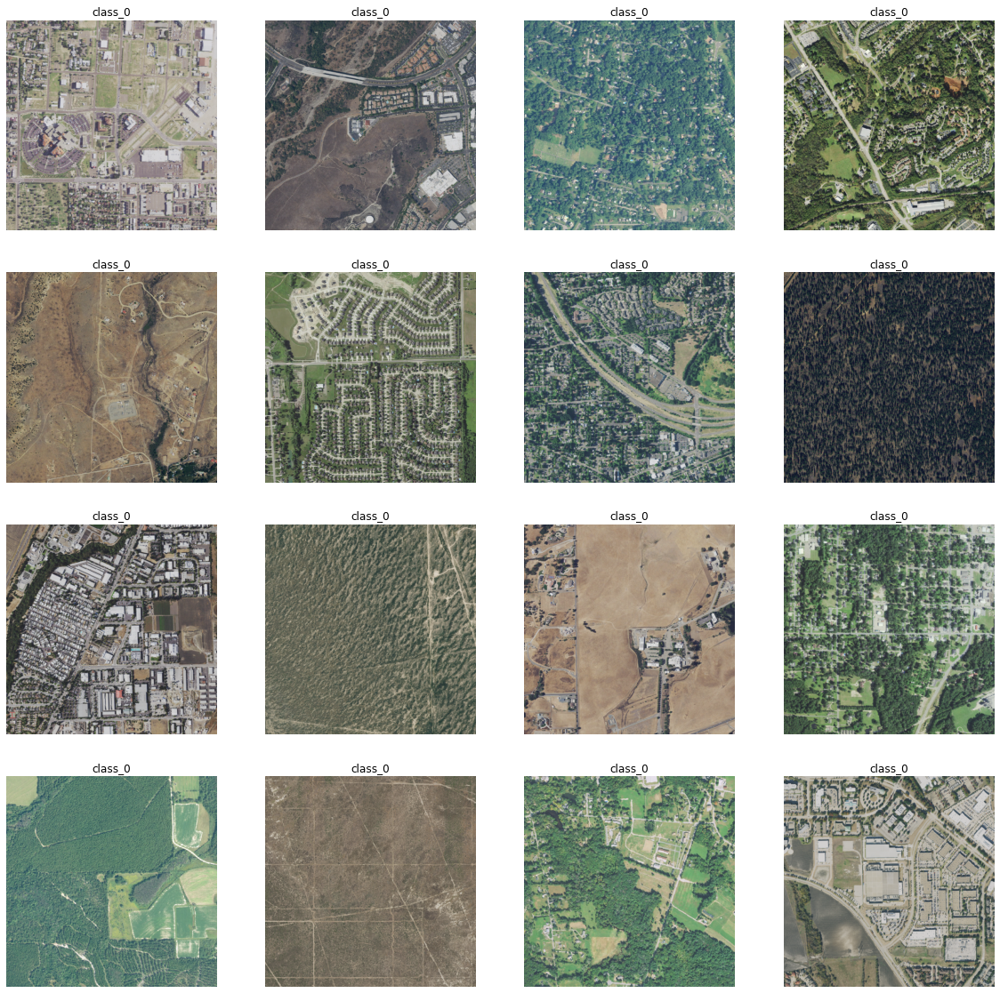

In [ ]:

#need to ask about this code below:
plt.figure(figsize=(20, 20))
for images, labels in train_ds.take(1):
  for i in range(16):
    x=images
    ax = plt.subplot(4, 4, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    plt.axis("off")

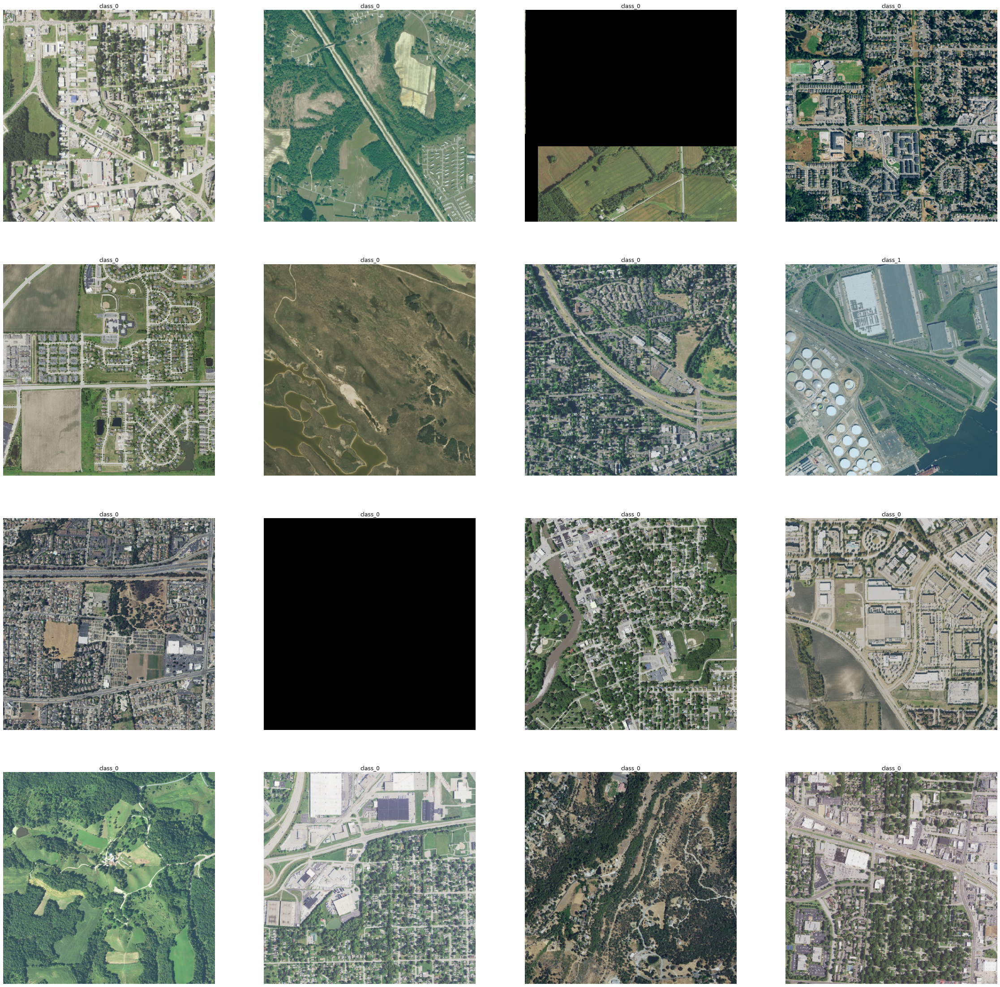

In [ ]:

#need to ask about this code below:
plt.figure(figsize=(40, 40))
for images, labels in train_ds.take(1):
  for i in range(16):
    x=images
    ax = plt.subplot(4, 4, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    plt.axis("off")